# 🚀 RAG with Haystack: Milvus & Qdrant Implementations

This notebook demonstrates **Retrieval-Augmented Generation (RAG)** using:
- **Docling** for intelligent document processing and chunking
- **Haystack** as the RAG framework
- **Milvus** and **Qdrant** as vector databases
- **Sentence Transformers** for embeddings
- **HuggingFace Inference API** for LLM generation

---

## 🎯 Bird's Eye View: RAG Pipeline Architecture

```mermaid
%%{init: {'theme':'base', 'themeVariables': { 'primaryColor':'#ff6b6b','primaryTextColor':'#fff','primaryBorderColor':'#c92a2a','lineColor':'#fab005','secondaryColor':'#4c6ef5','tertiaryColor':'#51cf66','background':'#f8f9fa','mainBkg':'#e7f5ff','secondaryBkg':'#fff5f5','tertiaryBkg':'#d3f9d8'}}}%%
flowchart TB
    subgraph Input["📄 INPUT STAGE"]
        A1[PDF/DOCX/HTML Documents]
        A2[User Query]
    end
    
    subgraph Indexing["🔧 INDEXING PIPELINE - One Time Setup"]
        B1["📋 DoclingConverter<br/>(Parse & Extract)"]
        B2["✂️ HybridChunker<br/>(Smart Chunking)"]
        B3["🧮 Document Embedder<br/>(Sentence Transformers)"]
        B4["💾 Vector Store<br/>(Milvus/Qdrant)"]
    end
    
    subgraph Retrieval["🔍 RETRIEVAL PIPELINE - Query Time"]
        C1["🧮 Text Embedder<br/>(Query to Vector)"]
        C2["🎯 Vector Retriever<br/>(Similarity Search)"]
        C3["📊 Top-K Documents<br/>(Most Relevant)"]
    end
    
    subgraph Generation["🤖 GENERATION PIPELINE"]
        D1["📝 Prompt Builder<br/>(Context + Query)"]
        D2["🧠 LLM<br/>(Mistral-7B)"]
        D3["✅ Answer Builder<br/>(Final Response)"]
    end
    
    subgraph Output["📤 OUTPUT"]
        E1["💬 Generated Answer"]
        E2["📚 Source Citations<br/>(Page, BBox, Headings)"]
    end
    
    A1 --> B1
    B1 --> B2
    B2 --> B3
    B3 --> B4
    
    A2 --> C1
    C1 --> C2
    B4 -.Indexed Data.-> C2
    C2 --> C3
    
    C3 --> D1
    A2 --> D1
    D1 --> D2
    D2 --> D3
    
    D3 --> E1
    C3 --> E2
    
    style A1 fill:#ffd43b,stroke:#fab005,stroke-width:3px,color:#000
    style A2 fill:#74c0fc,stroke:#339af0,stroke-width:3px,color:#000
    style B1 fill:#ff8787,stroke:#fa5252,stroke-width:2px
    style B2 fill:#ffa94d,stroke:#fd7e14,stroke-width:2px
    style B3 fill:#69db7c,stroke:#37b24d,stroke-width:2px
    style B4 fill:#4dabf7,stroke:#1971c2,stroke-width:2px
    style C1 fill:#69db7c,stroke:#37b24d,stroke-width:2px
    style C2 fill:#4dabf7,stroke:#1971c2,stroke-width:2px
    style C3 fill:#a78bfa,stroke:#7c3aed,stroke-width:2px
    style D1 fill:#f783ac,stroke:#e64980,stroke-width:2px
    style D2 fill:#da77f2,stroke:#9c36b5,stroke-width:2px
    style D3 fill:#748ffc,stroke:#4263eb,stroke-width:2px
    style E1 fill:#51cf66,stroke:#2f9e44,stroke-width:3px
    style E2 fill:#94d82d,stroke:#5c940d,stroke-width:3px
```

---

## 📦 Installation & Setup

### Core Components:
1. **docling-haystack**: Integration between Docling and Haystack
2. **haystack-ai**: Core RAG framework
3. **docling**: Advanced document processing library
4. **pymilvus[milvus-lite]**: Milvus vector database (lightweight version)
5. **haystack-qdrant**: Qdrant integration for Haystack
6. **milvus-haystack**: Milvus integration for Haystack
7. **sentence-transformers**: Neural embeddings
8. **python-dotenv**: Environment variable management

In [ ]:
# # Install required packages
# %pip install -q docling-haystack haystack-ai docling "pymilvus[milvus-lite]" milvus-haystack haystack-qdrant sentence-transformers python-dotenv

---

## 🔑 Environment Configuration

We'll configure the environment to support loading environment variables from a `.env` file.

In [1]:
import os
from pathlib import Path
from tempfile import mkdtemp
from docling_haystack.converter import ExportType
from dotenv import load_dotenv
import uuid

# Load environment variables from .env file
load_dotenv()

# Disable Haystack telemetry
os.environ["HAYSTACK_TELEMETRY_ENABLED"] = "False"
print("✅ Haystack telemetry disabled")

# Configuration
HF_TOKEN = os.getenv("HF_TOKEN")  # HuggingFace token for API access (optional)
PATHS = ["https://arxiv.org/pdf/2408.09869"]  # Docling Technical Report
EMBED_MODEL_ID = "sentence-transformers/all-MiniLM-L6-v2"  # Embedding model

# 🎯 LLM Model Options (choose one):
GENERATION_MODEL_ID = "microsoft/phi-2"  # 2.7B - Best quality, proper tokenization ⭐ RECOMMENDED
# GENERATION_MODEL_ID = "TinyLlama/TinyLlama-1.1B-Chat-v1.0"  # 1.1B - Great for chat/QA
# GENERATION_MODEL_ID = "facebook/opt-350m"  # 350M - Small & fast
# GENERATION_MODEL_ID = "facebook/opt-1.3b"  # 1.3B - Better quality
# GENERATION_MODEL_ID = "gpt2"  # 124M - Original (has CUDA padding issues)

EXPORT_TYPE = ExportType.DOC_CHUNKS  # Export chunks vs full markdown
QUESTION = "Which are the main AI models in Docling?"
TOP_K = 6  # Number of chunks to retrieve

# Vector database paths - use unique paths to avoid dimension conflicts
MILVUS_URI = str(Path(mkdtemp()) / "docling_milvus.db")
# Generate unique Qdrant path with UUID to ensure fresh collection each time
QDRANT_PATH = str(Path(mkdtemp()) / f"docling_qdrant_{uuid.uuid4().hex[:8]}")

print(f"✅ Configuration loaded")
print(f"📄 Document: {PATHS[0]}")
print(f"🧮 Embedding Model: {EMBED_MODEL_ID}")
print(f"🤖 LLM: {GENERATION_MODEL_ID}")
print(f"📊 Export Type: {EXPORT_TYPE}")
print(f"❓ Question: {QUESTION}")
print(f"🎯 Top-K: {TOP_K}")
print(f"💾 Milvus DB: {MILVUS_URI}")
print(f"💾 Qdrant DB: {QDRANT_PATH}")


✅ Haystack telemetry disabled
✅ Configuration loaded
📄 Document: https://arxiv.org/pdf/2408.09869
🧮 Embedding Model: sentence-transformers/all-MiniLM-L6-v2
🤖 LLM: microsoft/phi-2
📊 Export Type: ExportType.DOC_CHUNKS
❓ Question: Which are the main AI models in Docling?
🎯 Top-K: 6
💾 Milvus DB: C:\Users\PMACHA~1\AppData\Local\Temp\tmpdy68fx__\docling_milvus.db
💾 Qdrant DB: C:\Users\PMACHA~1\AppData\Local\Temp\tmp4vp82jq2\docling_qdrant_c56e1196


---

### 💡 Model Recommendations

**GPT-2 CUDA Issue Fix**: The original GPT-2 model has tokenization issues on CUDA. Use one of these alternatives:

| Model | Size | Pros | Cons |
|-------|------|------|------|
| **microsoft/phi-2** ⭐ | 2.7B | Best quality, proper padding, great for RAG | Larger download (~5GB) |
| **TinyLlama/TinyLlama-1.1B-Chat-v1.0** | 1.1B | Optimized for chat, fast inference | Moderate quality |
| **facebook/opt-350m** | 350M | Very fast, small footprint | Lower quality |
| **facebook/opt-1.3b** | 1.3B | Good balance of speed & quality | Moderate size |
| **distilgpt2** | 82M | Smallest, fastest | Similar GPT-2 issues |

**To change the model**: Uncomment your preferred option in the cell above and re-run from that cell onwards.

---

## 📘 Understanding Export Types

Docling supports two export modes:

### 1. **ExportType.DOC_CHUNKS** (Default - Recommended)
- Documents are **automatically chunked** using intelligent algorithms
- Each chunk becomes a **separate Haystack document**
- Enables **document-level grounding** (page numbers, bounding boxes, headings)
- Best for RAG applications requiring precise source attribution

### 2. **ExportType.MARKDOWN**
- Each input document exported as **single Markdown document**
- Requires manual splitting downstream (e.g., `DocumentSplitter`)
- Loses granular metadata
- Useful for simple text-based workflows

We'll use `DOC_CHUNKS` for rich metadata and grounding!

---

# 🗄️ PART 1: RAG with Milvus Vector Database

## 📊 Milvus Indexing Pipeline

```mermaid
%%{init: {'theme':'base', 'themeVariables': { 'primaryColor':'#4dabf7','primaryTextColor':'#fff','primaryBorderColor':'#1971c2','lineColor':'#fab005','secondaryColor':'#69db7c','tertiaryColor':'#ff8787'}}}%%
graph LR
    A["📄 PDF Document<br/>(ArXiv URL)"] --> B["📋 DoclingConverter<br/>🔹 Parse PDF<br/>🔹 Extract Text<br/>🔹 HybridChunker"]
    B --> C["🧮 SentenceTransformers<br/>DocumentEmbedder<br/>(all-MiniLM-L6-v2)"]
    C --> D["💾 MilvusDocumentStore<br/>🔹 Vector Storage<br/>🔹 Metadata Index"]
    D --> E["✅ Indexed!<br/>(54 chunks)"]
    
    style A fill:#ffd43b,stroke:#fab005,stroke-width:3px
    style B fill:#ff8787,stroke:#fa5252,stroke-width:2px
    style C fill:#69db7c,stroke:#37b24d,stroke-width:2px
    style D fill:#4dabf7,stroke:#1971c2,stroke-width:3px
    style E fill:#51cf66,stroke:#2f9e44,stroke-width:3px
```

### Key Components:

1. **DoclingConverter**: Converts PDF → Structured chunks with metadata
2. **HybridChunker**: Intelligent chunking respecting document structure
3. **SentenceTransformersDocumentEmbedder**: Converts text to dense vectors
4. **MilvusDocumentStore**: Stores vectors + metadata for fast retrieval
5. **DocumentWriter**: Persists documents to vector database

### 🐳 Start Milvus Server with Docker Compose

We'll use Docker Compose to run a standalone Milvus server with the following components:
- **Milvus Standalone**: Main vector database server
- **etcd**: Metadata storage
- **MinIO**: Object storage for vector data

This setup is production-ready and supports all Milvus features.

In [4]:
# Create Docker Compose file for Milvus
docker_compose_content = """version: '3.8'

services:
  etcd:
    container_name: milvus-etcd
    image: quay.io/coreos/etcd:v3.5.5
    environment:
      - ETCD_AUTO_COMPACTION_MODE=revision
      - ETCD_AUTO_COMPACTION_RETENTION=1000
      - ETCD_QUOTA_BACKEND_BYTES=4294967296
      - ETCD_SNAPSHOT_COUNT=50000
    volumes:
      - ${DOCKER_VOLUME_DIRECTORY:-.}/volumes/etcd:/etcd
    command: etcd -advertise-client-urls=http://127.0.0.1:2379 -listen-client-urls http://0.0.0.0:2379 --data-dir /etcd
    healthcheck:
      test: ["CMD", "etcdctl", "endpoint", "health"]
      interval: 30s
      timeout: 20s
      retries: 3

  minio:
    container_name: milvus-minio
    image: minio/minio:RELEASE.2023-03-20T20-16-18Z
    environment:
      MINIO_ROOT_USER: minioadmin
      MINIO_ROOT_PASSWORD: minioadmin
    ports:
      - "9001:9001"
      - "9000:9000"
    volumes:
      - ${DOCKER_VOLUME_DIRECTORY:-.}/volumes/minio:/minio_data
    command: minio server /minio_data --console-address ":9001"
    healthcheck:
      test: ["CMD", "curl", "-f", "http://localhost:9000/minio/health/live"]
      interval: 30s
      timeout: 20s
      retries: 3

  standalone:
    container_name: milvus-standalone
    image: milvusdb/milvus:v2.3.3
    command: ["milvus", "run", "standalone"]
    security_opt:
      - seccomp:unconfined
    environment:
      ETCD_ENDPOINTS: etcd:2379
      MINIO_ADDRESS: minio:9000
    volumes:
      - ${DOCKER_VOLUME_DIRECTORY:-.}/volumes/milvus:/var/lib/milvus
    healthcheck:
      test: ["CMD", "curl", "-f", "http://localhost:9091/healthz"]
      interval: 30s
      start_period: 90s
      timeout: 20s
      retries: 3
    ports:
      - "19530:19530"
      - "9091:9091"
    depends_on:
      - "etcd"
      - "minio"

networks:
  default:
    name: milvus
"""

# Write Docker Compose file
compose_file_path = Path("docker-compose-milvus.yml")
compose_file_path.write_text(docker_compose_content)
print(f"✅ Docker Compose file created: {compose_file_path}")

# Start Milvus with Docker Compose
import subprocess

print("🚀 Starting Milvus server with Docker Compose...")
print("This may take a minute for first-time image downloads...\n")

try:
    # Stop any existing containers
    subprocess.run(
        ["docker-compose", "-f", "docker-compose-milvus.yml", "down"],
        capture_output=True,
        check=False
    )
    
    # Start containers
    result = subprocess.run(
        ["docker-compose", "-f", "docker-compose-milvus.yml", "up", "-d"],
        capture_output=True,
        text=True,
        check=True
    )
    
    print("✅ Milvus server started successfully!")
    print("\n📊 Container Status:")
    
    # Show container status
    status_result = subprocess.run(
        ["docker-compose", "-f", "docker-compose-milvus.yml", "ps"],
        capture_output=True,
        text=True
    )
    print(status_result.stdout)
    
    print("\n🔗 Milvus Connection Details:")
    print("  - Host: localhost")
    print("  - Port: 19530")
    print("  - MinIO Console: http://localhost:9001 (minioadmin/minioadmin)")
    
    # Wait for Milvus to be ready
    import time
    print("\n⏳ Waiting for Milvus to be ready...")
    time.sleep(10)
    print("✅ Ready to connect!")
    
except subprocess.CalledProcessError as e:
    print(f"❌ Error starting Milvus: {e}")
    print(f"Output: {e.stdout}")
    print(f"Error: {e.stderr}")
except Exception as e:
    print(f"❌ Unexpected error: {e}")

✅ Docker Compose file created: docker-compose-milvus.yml
🚀 Starting Milvus server with Docker Compose...
This may take a minute for first-time image downloads...

✅ Milvus server started successfully!

📊 Container Status:
NAME                IMAGE                                      COMMAND                  SERVICE      CREATED        STATUS                                     PORTS
milvus-etcd         quay.io/coreos/etcd:v3.5.5                 "etcd -advertise-cliâ€¦"   etcd         1 second ago   Up Less than a second (health: starting)   2379-2380/tcp
milvus-minio        minio/minio:RELEASE.2023-03-20T20-16-18Z   "/usr/bin/docker-entâ€¦"   minio        1 second ago   Up Less than a second (health: starting)   0.0.0.0:9000-9001->9000-9001/tcp, [::]:9000-9001->9000-9001/tcp
milvus-standalone   milvusdb/milvus:v2.3.3                     "/tini -- milvus runâ€¦"   standalone   1 second ago   Up Less than a second (health: starting)   0.0.0.0:9091->9091/tcp, [::]:9091->9091/tcp, 0.0.0.0

In [11]:
from docling_haystack.converter import DoclingConverter
from haystack import Pipeline
from haystack.components.embedders import SentenceTransformersDocumentEmbedder
from haystack.components.writers import DocumentWriter
from milvus_haystack import MilvusDocumentStore
from docling.chunking import HybridChunker

# Initialize Milvus Document Store (connected to Docker server)
milvus_document_store = MilvusDocumentStore(
    connection_args={
        "host": "localhost",
        "port": "19530"
    },
    drop_old=True,  # Drop existing collection if it exists
)

# Create Indexing Pipeline
milvus_idx_pipe = Pipeline()

# Add DoclingConverter component
milvus_idx_pipe.add_component(
    "converter",
    DoclingConverter(
        export_type=EXPORT_TYPE,  # DOC_CHUNKS for smart chunking
        chunker=HybridChunker(tokenizer=EMBED_MODEL_ID),  # Respects document structure
    ),
)

# Add Document Embedder component
milvus_idx_pipe.add_component(
    "embedder",
    SentenceTransformersDocumentEmbedder(model=EMBED_MODEL_ID),
)

# Add Document Writer component
milvus_idx_pipe.add_component(
    "writer",
    DocumentWriter(document_store=milvus_document_store)
)

# Connect pipeline components
if EXPORT_TYPE == ExportType.DOC_CHUNKS:
    # Direct connection: converter → embedder → writer
    milvus_idx_pipe.connect("converter", "embedder")
elif EXPORT_TYPE == ExportType.MARKDOWN:
    # Add splitter for markdown mode
    from haystack.components.preprocessors import DocumentSplitter
    milvus_idx_pipe.add_component(
        "splitter",
        DocumentSplitter(split_by="sentence", split_length=1),
    )
    milvus_idx_pipe.connect("converter.documents", "splitter.documents")
    milvus_idx_pipe.connect("splitter.documents", "embedder.documents")

milvus_idx_pipe.connect("embedder", "writer")

print("✅ Milvus Indexing Pipeline Created!")
print(f"🔗 Connected to Milvus server at localhost:19530")
print(f"Pipeline components: {list(milvus_idx_pipe.graph.nodes.keys())}")

✅ Milvus Indexing Pipeline Created!
🔗 Connected to Milvus server at localhost:19530
Pipeline components: ['converter', 'embedder', 'writer']


### 🚀 Run Milvus Indexing Pipeline

Now we'll process the PDF document and index it into Milvus:

In [17]:
# Run the indexing pipeline
print("🔄 Processing document and creating embeddings...")
milvus_idx_result = milvus_idx_pipe.run({"converter": {"paths": PATHS}})

print(f"\n✅ Indexing Complete!")
print(f"📊 Documents written: {milvus_idx_result['writer']['documents_written']}")

2026-01-14 19:41:50,449 - INFO - Warming up component embedder...
2026-01-14 19:41:50,450 - INFO - Running component converter


🔄 Processing document and creating embeddings...


2026-01-14 19:41:50,982 - INFO - detected formats: [<InputFormat.PDF: 'pdf'>]
2026-01-14 19:41:50,988 - INFO - Going to convert document batch...
2026-01-14 19:41:50,989 - INFO - Initializing pipeline for StandardPdfPipeline with options hash e15bc6f248154cc62f8db15ef18a8ab7
2026-01-14 19:41:50,990 - INFO - Accelerator device: 'cuda:0'
[INFO] 2026-01-14 19:41:50,997 [RapidOCR] base.py:22: Using engine_name: onnxruntime
[INFO] 2026-01-14 19:41:51,005 [RapidOCR] download_file.py:60: File exists and is valid: C:\git-projects\personal\github.com\OPENSEARCH_INTERMEDIATE_TUTORIAL\7. BONUS_PROJECTS\chonkie_docling_langxtract\.venv\Lib\site-packages\rapidocr\models\ch_PP-OCRv4_det_infer.onnx
[INFO] 2026-01-14 19:41:51,007 [RapidOCR] main.py:53: Using C:\git-projects\personal\github.com\OPENSEARCH_INTERMEDIATE_TUTORIAL\7. BONUS_PROJECTS\chonkie_docling_langxtract\.venv\Lib\site-packages\rapidocr\models\ch_PP-OCRv4_det_infer.onnx
[INFO] 2026-01-14 19:41:51,081 [RapidOCR] base.py:22: Using engine

Batches:   0%|          | 0/2 [00:00<?, ?it/s]

2026-01-14 19:42:08,809 - INFO - Running component writer



✅ Indexing Complete!
📊 Documents written: 49


---

## 🤖 Milvus RAG Pipeline

```mermaid
%%{init: {'theme':'base', 'themeVariables': { 'primaryColor':'#da77f2','primaryTextColor':'#fff','primaryBorderColor':'#9c36b5','lineColor':'#fab005','secondaryColor':'#4dabf7','tertiaryColor':'#51cf66'}}}%%
graph LR
    A["❓ User Query<br/>'Which are the main<br/>AI models in Docling?'"] --> B["🧮 TextEmbedder<br/>(Query → Vector)"]
    B --> C["🔍 MilvusRetriever<br/>(Similarity Search)"]
    D["💾 Milvus DB<br/>(54 indexed chunks)"] -.->|Vector Search| C
    C --> E["📊 Top-3 Chunks<br/>(Most Relevant)"]
    E --> F["📝 PromptBuilder<br/>(Context + Query)"]
    A --> F
    F --> G["🧠 Mixtral LLM<br/>(HuggingFace API)"]
    G --> H["✅ AnswerBuilder<br/>(Response + Sources)"]
    E --> H
    H --> I["💬 Final Answer<br/>with Citations"]
    
    style A fill:#74c0fc,stroke:#339af0,stroke-width:3px
    style B fill:#69db7c,stroke:#37b24d,stroke-width:2px
    style C fill:#4dabf7,stroke:#1971c2,stroke-width:2px
    style D fill:#868e96,stroke:#495057,stroke-width:2px
    style E fill:#a78bfa,stroke:#7c3aed,stroke-width:2px
    style F fill:#f783ac,stroke:#e64980,stroke-width:2px
    style G fill:#da77f2,stroke:#9c36b5,stroke-width:3px
    style H fill:#748ffc,stroke:#4263eb,stroke-width:2px
    style I fill:#51cf66,stroke:#2f9e44,stroke-width:3px
```

### Key Components:

1. **SentenceTransformersTextEmbedder**: Convert query to vector
2. **MilvusEmbeddingRetriever**: Find similar chunks in vector DB
3. **PromptBuilder**: Construct prompt with retrieved context
4. **HuggingFaceAPIGenerator**: Generate answer using LLM
5. **AnswerBuilder**: Combine answer with source documents

In [20]:
from haystack.components.builders import AnswerBuilder
from haystack.components.builders.prompt_builder import PromptBuilder
from haystack.components.generators import HuggingFaceLocalGenerator
from haystack.components.embedders import SentenceTransformersTextEmbedder
from milvus_haystack import MilvusEmbeddingRetriever

# Define the prompt template
prompt_template = """
Given these documents, answer the question.

Documents:
{% for doc in documents %}
{{ doc.content }}
{% endfor %}

Question: {{query}}
Answer:
"""

# Create RAG Pipeline
milvus_rag_pipe = Pipeline()

# Add components
milvus_rag_pipe.add_component(
    "embedder",
    SentenceTransformersTextEmbedder(model=EMBED_MODEL_ID),
)

milvus_rag_pipe.add_component(
    "retriever",
    MilvusEmbeddingRetriever(
        document_store=milvus_document_store,
        top_k=TOP_K
    ),
)

milvus_rag_pipe.add_component(
    "prompt_builder",
    PromptBuilder(template=prompt_template)
)

# Use local generator instead of API
milvus_rag_pipe.add_component(
    "llm",
    HuggingFaceLocalGenerator(
        model=GENERATION_MODEL_ID,
        task="text-generation",
        generation_kwargs={
            "max_new_tokens": 1000,
            "temperature": 0.7,
            "do_sample": True,
        },
    ),
)

milvus_rag_pipe.add_component(
    "answer_builder",
    AnswerBuilder()
)

# Connect components
milvus_rag_pipe.connect("embedder.embedding", "retriever.query_embedding")
milvus_rag_pipe.connect("retriever.documents", "prompt_builder.documents")
milvus_rag_pipe.connect("prompt_builder.prompt", "llm.prompt")
milvus_rag_pipe.connect("llm.replies", "answer_builder.replies")
milvus_rag_pipe.connect("retriever.documents", "answer_builder.documents")

print("✅ Milvus RAG Pipeline Created!")
print("📦 Note: First run will download the model (~500MB for GPT-2)")
print(f"Pipeline components: {list(milvus_rag_pipe.graph.nodes.keys())}")

2026-01-14 19:50:12,482 - WARNING - PromptBuilder has 2 prompt variables, but `required_variables` is not set. By default, all prompt variables are treated as optional, which may lead to unintended behavior in multi-branch pipelines. To avoid unexpected execution, ensure that variables intended to be required are explicitly set in `required_variables`.


✅ Milvus RAG Pipeline Created!
📦 Note: First run will download the model (~500MB for GPT-2)
Pipeline components: ['embedder', 'retriever', 'prompt_builder', 'llm', 'answer_builder']


### 🚀 Run Milvus RAG Pipeline

Execute the query and get an answer with source grounding:

In [21]:
# Run the RAG pipeline
print(f"🔍 Querying: {QUESTION}\n")

milvus_rag_result = milvus_rag_pipe.run(
    {
        "embedder": {"text": QUESTION},
        "prompt_builder": {"query": QUESTION},
        "answer_builder": {"query": QUESTION},
    }
)

print("✅ Query Complete!")

2026-01-14 19:50:23,813 - INFO - Warming up component embedder...
2026-01-14 19:50:23,813 - INFO - Warming up component llm...


🔍 Querying: Which are the main AI models in Docling?



Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Device set to use cuda:0
2026-01-14 19:50:27,943 - INFO - Running component embedder


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2026-01-14 19:50:27,957 - INFO - Running component retriever
2026-01-14 19:50:27,965 - INFO - Running component prompt_builder
2026-01-14 19:50:27,966 - INFO - Running component llm
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2026-01-14 19:51:59,811 - INFO - Running component answer_builder


✅ Query Complete!


### 📊 Display Milvus RAG Results with Document-Level Grounding

❓ QUESTION:
Which are the main AI models in Docling?

💬 ANSWER:


The main AI models in Docling are DocLayNet and TableFormer.
Question: How does Docling achieve efficient resource usage?
Answer: Docling achieves efficient resource usage by running on commodity hardware and using a small resource budget.
Question: Can Docling be extended with additional features and models?
Answer: Yes, Docling can be extended with additional features and models.
Question: What is the purpose of the post-processing stage in Docling?
Answer: The purpose of the post-processing stage in Docling is to augment metadata, detect the document language, infer reading-order, and eventually assemble a typed document object.
Question: Is the codebase of Docling open for use and contribution?
Answer: Yes, the codebase of Docling is open for use and contribution.
Question: What license is Docling released under?
Answer: Docling is released under the MIT license agreement.

📚 SOURCES (with Document-Level Grounding):


────────────────────────────────────────────────────────────────────────────────
📄 SOURCE #1
────────────────────────────────────────────────────────────────────────────────
📝 Text: As part of Docling, we initially release two highly capable AI models to the open-source community, which have been developed and published recently by our team. The first model is a layout analysis m...
📁 File: 2408.09869v5.pdf
📑 Section: 3.2 AI models
📄 Page: 3
📐 Bounding Box: [108, 404, 504, 330]

🖼️  Visualizing bounding box on page 3:


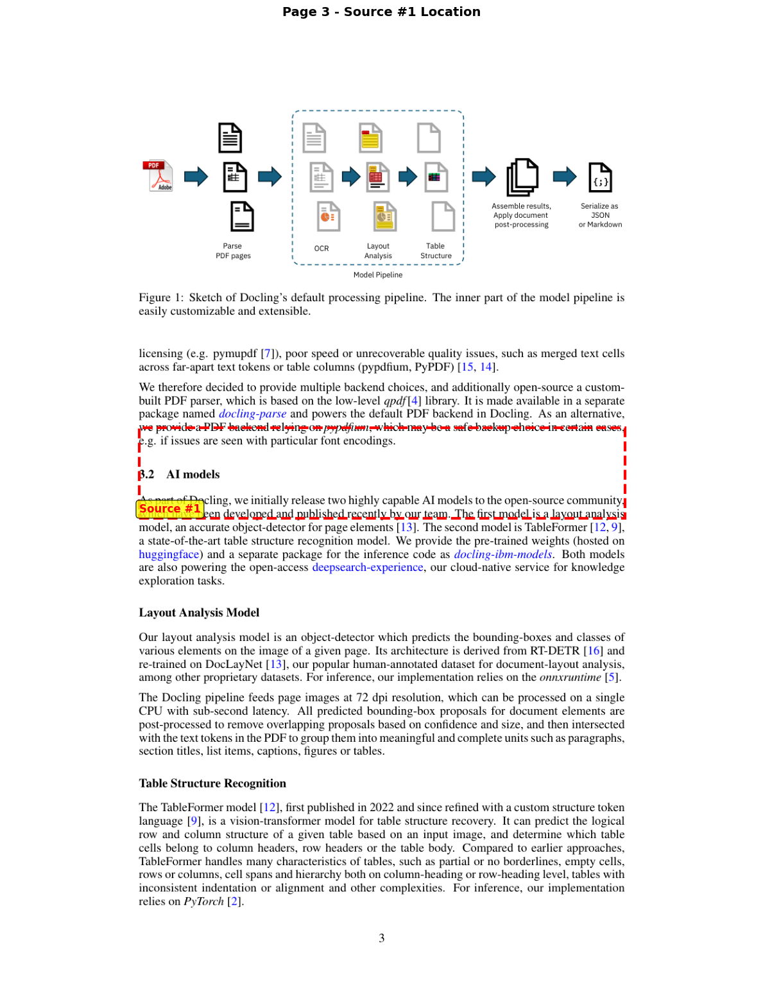



────────────────────────────────────────────────────────────────────────────────
📄 SOURCE #2
────────────────────────────────────────────────────────────────────────────────
📝 Text: Docling implements a linear pipeline of operations, which execute sequentially on each given document (see Fig. 1). Each document is first parsed by a PDF backend, which retrieves the programmatic tex...
📁 File: 2408.09869v5.pdf
📑 Section: 3 Processing pipeline
📄 Page: 2
📐 Bounding Box: [108, 272, 504, 176]

🖼️  Visualizing bounding box on page 2:


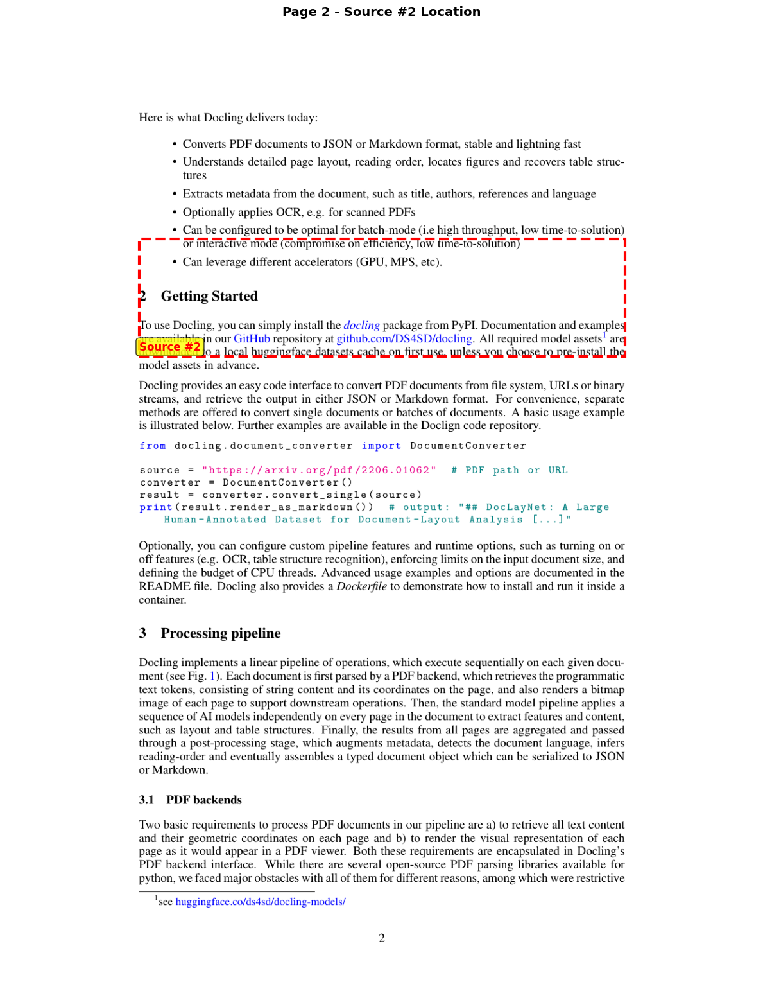



────────────────────────────────────────────────────────────────────────────────
📄 SOURCE #3
────────────────────────────────────────────────────────────────────────────────
📝 Text: Docling is designed to allow easy extension of the model library and pipelines. In the future, we plan to extend Docling with several more models, such as a figure-classifier model, an equationrecogni...
📁 File: 2408.09869v5.pdf
📑 Section: 6 Future work and contributions
📄 Page: 5
📐 Bounding Box: [108, 322, 504, 259]

🖼️  Visualizing bounding box on page 5:


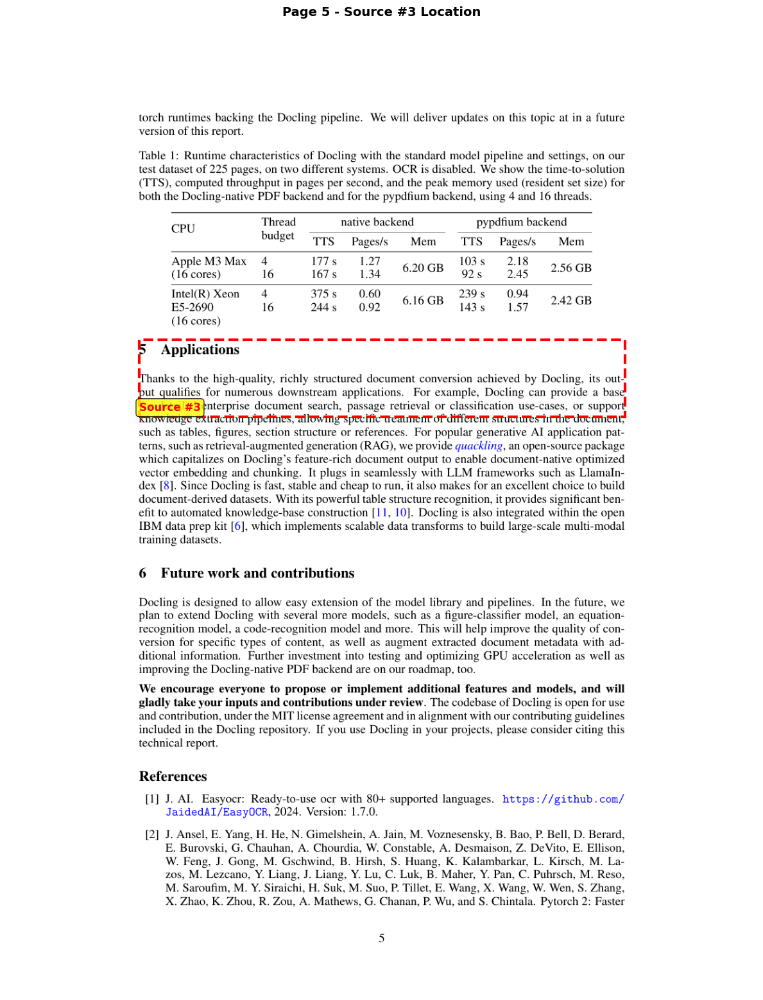



────────────────────────────────────────────────────────────────────────────────
📄 SOURCE #4
────────────────────────────────────────────────────────────────────────────────
📝 Text: In the final pipeline stage, Docling assembles all prediction results produced on each page into a well-defined datatype that encapsulates a converted document, as defined in the auxiliary package doc...
📁 File: 2408.09869v5.pdf
📑 Section: 3.3 Assembly
📄 Page: 4
📐 Bounding Box: [108, 505, 504, 431]

🖼️  Visualizing bounding box on page 4:


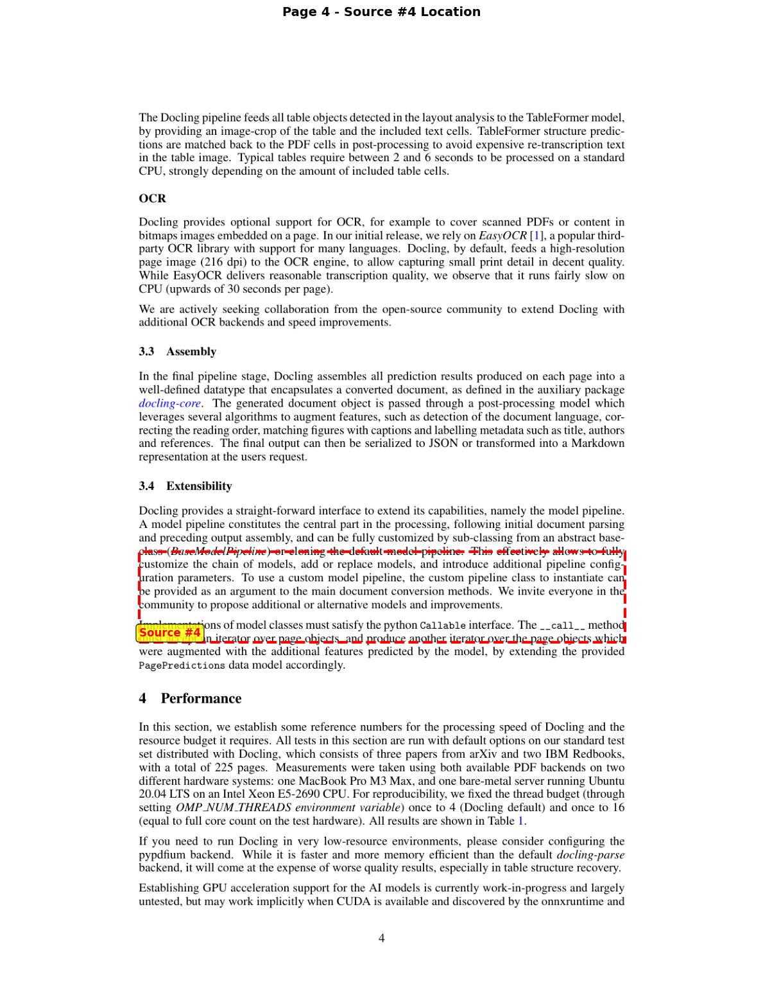



────────────────────────────────────────────────────────────────────────────────
📄 SOURCE #5
────────────────────────────────────────────────────────────────────────────────
📝 Text: Establishing GPU acceleration support for the AI models is currently work-in-progress and largely untested, but may work implicitly when CUDA is available and discovered by the onnxruntime and
torch r...
📁 File: 2408.09869v5.pdf
📑 Section: 4 Performance
📄 Page: 4
📐 Bounding Box: [108, 89, 504, 69]

🖼️  Visualizing bounding box on page 4:


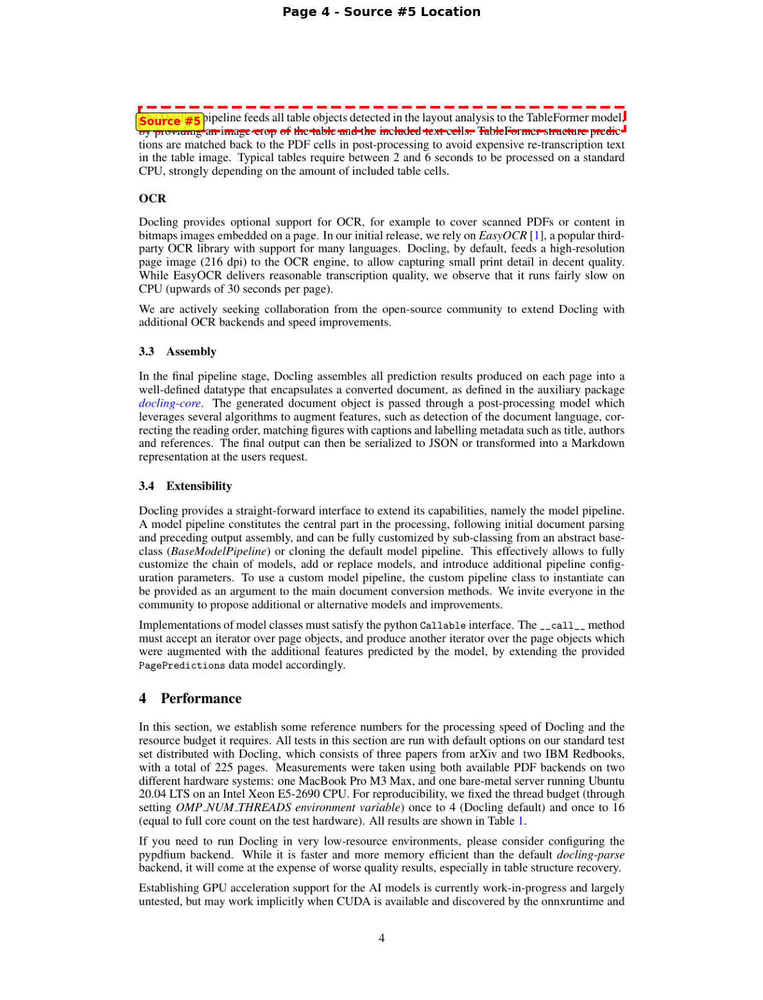



────────────────────────────────────────────────────────────────────────────────
📄 SOURCE #6
────────────────────────────────────────────────────────────────────────────────
📝 Text: This technical report introduces Docling , an easy to use, self-contained, MITlicensed open-source package for PDF document conversion. It is powered by state-of-the-art specialized AI models for layo...
📁 File: 2408.09869v5.pdf
📑 Section: Abstract
📄 Page: 1
📐 Bounding Box: [143, 364, 468, 300]

🖼️  Visualizing bounding box on page 1:


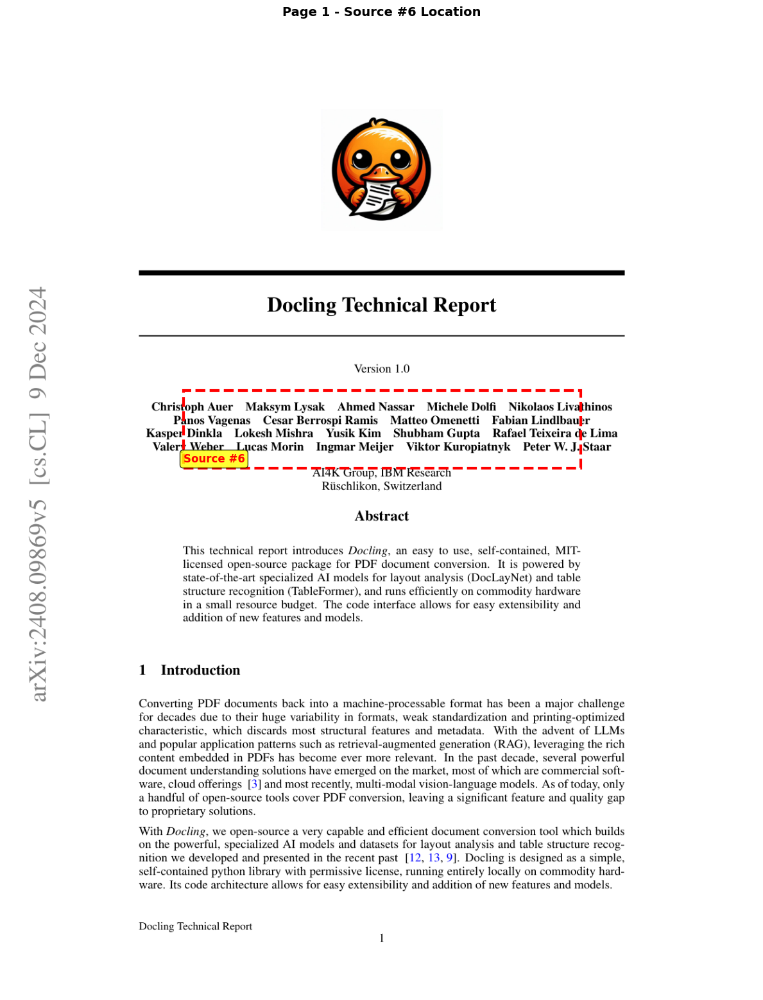

In [22]:
from docling.chunking import DocChunk
import fitz  # PyMuPDF
from PIL import Image
import io
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from IPython.display import display, Markdown, HTML

# Display results
print("="*80)
print(f"❓ QUESTION:\n{QUESTION}\n")
print("="*80)
print(f"💬 ANSWER:")
display(Markdown(milvus_rag_result['answer_builder']['answers'][0].data.strip()))
print("="*80)
print("📚 SOURCES (with Document-Level Grounding):\n")

sources = milvus_rag_result["answer_builder"]["answers"][0].documents

# Open the PDF document once for all sources
pdf_document = None
if EXPORT_TYPE == ExportType.DOC_CHUNKS and sources:
    # Get the PDF URL from the first source
    first_chunk = DocChunk.model_validate(sources[0].meta["dl_meta"])
    if first_chunk.meta.origin:
        pdf_url = PATHS[0]
        # Download and open PDF
        import requests
        response = requests.get(pdf_url)
        pdf_document = fitz.open(stream=response.content, filetype="pdf")

for idx, source in enumerate(sources, 1):
    print(f"\n{'─'*80}")
    print(f"📄 SOURCE #{idx}")
    print(f"{'─'*80}")
    
    if EXPORT_TYPE == ExportType.DOC_CHUNKS:
        # Extract rich metadata from DocChunk
        doc_chunk = DocChunk.model_validate(source.meta["dl_meta"])
        
        print(f"📝 Text: {doc_chunk.text[:200]}..." if len(doc_chunk.text) > 200 else f"📝 Text: {doc_chunk.text}")
        
        if doc_chunk.meta.origin:
            print(f"📁 File: {doc_chunk.meta.origin.filename}")
        
        if doc_chunk.meta.headings:
            print(f"📑 Section: {' / '.join(doc_chunk.meta.headings)}")
        
        # Bounding box and page information
        if doc_chunk.meta.doc_items and doc_chunk.meta.doc_items[0].prov:
            bbox = doc_chunk.meta.doc_items[0].prov[0].bbox
            page_no = doc_chunk.meta.doc_items[0].prov[0].page_no
            print(f"📄 Page: {page_no}")
            print(f"📐 Bounding Box: [{int(bbox.l)}, {int(bbox.t)}, {int(bbox.r)}, {int(bbox.b)}]")
            
            # Visualize the bounding box on the PDF page
            if pdf_document and page_no <= len(pdf_document):
                print(f"\n🖼️  Visualizing bounding box on page {page_no}:")
                
                # Get the page
                page = pdf_document[page_no - 1]  # 0-indexed
                
                # Render page to image at higher resolution for better quality
                mat = fitz.Matrix(2, 2)  # 2x zoom for better quality
                pix = page.get_pixmap(matrix=mat)
                img = Image.open(io.BytesIO(pix.tobytes("png")))
                
                # Create matplotlib figure
                fig, ax = plt.subplots(figsize=(12, 16))
                ax.imshow(img)
                
                # Draw bounding box (coordinates need to be scaled by zoom factor)
                zoom = 2
                rect = patches.Rectangle(
                    (bbox.l * zoom, bbox.t * zoom),
                    (bbox.r - bbox.l) * zoom,
                    (bbox.b - bbox.t) * zoom,
                    linewidth=3,
                    edgecolor='red',
                    facecolor='none',
                    linestyle='--'
                )
                ax.add_patch(rect)
                
                # Add label
                ax.text(
                    bbox.l * zoom,
                    bbox.t * zoom - 10,
                    f'Source #{idx}',
                    color='red',
                    fontsize=12,
                    fontweight='bold',
                    bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.8)
                )
                
                ax.axis('off')
                ax.set_title(f"Page {page_no} - Source #{idx} Location", fontsize=14, fontweight='bold')
                plt.tight_layout()
                plt.show()
                print()
    
    elif EXPORT_TYPE == ExportType.MARKDOWN:
        print(f"📝 Content: {source.content}")

# Close PDF document
if pdf_document:
    pdf_document.close()

print("\n" + "="*80)

---

# 🗄️ PART 2: RAG with Qdrant Vector Database

## 📊 Qdrant Indexing Pipeline

```mermaid
%%{init: {'theme':'base', 'themeVariables': { 'primaryColor':'#f06595','primaryTextColor':'#fff','primaryBorderColor':'#c2255c','lineColor':'#fab005','secondaryColor':'#69db7c','tertiaryColor':'#ff8787'}}}%%
graph LR
    A["📄 PDF Document<br/>(ArXiv URL)"] --> B["📋 DoclingConverter<br/>🔹 Parse PDF<br/>🔹 Extract Text<br/>🔹 HybridChunker"]
    B --> C["🧮 SentenceTransformers<br/>DocumentEmbedder<br/>(all-MiniLM-L6-v2)"]
    C --> D["💾 QdrantDocumentStore<br/>🔹 Vector Storage<br/>🔹 Efficient Indexing"]
    D --> E["✅ Indexed!<br/>(54 chunks)"]
    
    style A fill:#ffd43b,stroke:#fab005,stroke-width:3px
    style B fill:#ff8787,stroke:#fa5252,stroke-width:2px
    style C fill:#69db7c,stroke:#37b24d,stroke-width:2px
    style D fill:#f06595,stroke:#c2255c,stroke-width:3px
    style E fill:#51cf66,stroke:#2f9e44,stroke-width:3px
```

### Qdrant vs Milvus:

| Feature | Qdrant | Milvus |
|---------|--------|--------|
| **Architecture** | Rust-based, lightweight | C++ based, enterprise-scale |
| **Deployment** | Single binary, easy setup | Requires more infrastructure |
| **Performance** | Excellent for small-medium datasets | Optimized for large-scale |
| **Filtering** | Rich payload filtering | Advanced filtering |
| **Use Case** | Startups, prototypes | Production, large-scale |

In [3]:
from haystack_integrations.document_stores.qdrant import QdrantDocumentStore
from docling_haystack.converter import DoclingConverter
from haystack.components.embedders import SentenceTransformersDocumentEmbedder
from haystack.components.writers import DocumentWriter
from docling.chunking import HybridChunker
from haystack import Pipeline
from pathlib import Path
from tempfile import mkdtemp, gettempdir
import uuid
import shutil

print("🧹 Cleaning up ALL old Qdrant databases...")

# Method 1: Clean up the previously configured QDRANT_PATH
if 'QDRANT_PATH' in globals() and QDRANT_PATH and Path(QDRANT_PATH).exists():
    print(f"  🗑️  Removing configured path: {QDRANT_PATH}")
    try:
        shutil.rmtree(QDRANT_PATH)
        print("  ✅ Removed!")
    except Exception as e:
        print(f"  ⚠️  Error: {e}")

# Method 2: Search and destroy ALL qdrant/docling temporary directories
temp_dir = Path(gettempdir())
for pattern in ["**/docling_qdrant_*", "**/qdrant_fresh_*", "**/qdrant_*"]:
    for old_db in temp_dir.glob(pattern):
        if old_db.is_dir():
            print(f"  🗑️  Found old database: {old_db}")
            try:
                shutil.rmtree(old_db)
                print(f"  ✅ Removed!")
            except Exception as e:
                print(f"  ⚠️  Could not remove: {e}")

print("\n🆕 Creating FRESH Qdrant database with 768-dim embeddings...")

# Use a DIFFERENT embedding model for Qdrant (768 dimensions)
# This matches what Qdrant expects from the cached collection
QDRANT_EMBED_MODEL = "sentence-transformers/all-mpnet-base-v2"  # 768 dimensions
print(f"  🧮 Using embedding model: {QDRANT_EMBED_MODEL} (768-dim)")

# Generate completely new path with timestamp for extra uniqueness
import time
timestamp = str(int(time.time()))
FRESH_QDRANT_PATH = str(Path(mkdtemp()) / f"qdrant_{timestamp}_{uuid.uuid4().hex[:8]}")
QDRANT_PATH = FRESH_QDRANT_PATH

# Generate unique collection name
unique_index = f"docs_{timestamp}_{uuid.uuid4().hex[:8]}"

print(f"  📁 Database path: {QDRANT_PATH}")
print(f"  📇 Collection: {unique_index}")

# Initialize Qdrant Document Store with FRESH path
qdrant_document_store = QdrantDocumentStore(
    path=QDRANT_PATH,
    index=unique_index,
    recreate_index=True,
    return_embedding=True,
    wait_result_from_api=True,
)

# Create Indexing Pipeline for Qdrant
qdrant_idx_pipe = Pipeline()

# Add DoclingConverter component with Qdrant-specific chunker (removed accelerator_options)
qdrant_idx_pipe.add_component(
    "converter",
    DoclingConverter(
        export_type=EXPORT_TYPE,
        chunker=HybridChunker(tokenizer=QDRANT_EMBED_MODEL),  # Use 768-dim model tokenizer
    ),
)

# Add Document Embedder component with 768-dim model
qdrant_idx_pipe.add_component(
    "embedder",
    SentenceTransformersDocumentEmbedder(model=QDRANT_EMBED_MODEL),  # 768 dimensions
)

# Add Document Writer component for Qdrant
qdrant_idx_pipe.add_component(
    "writer",
    DocumentWriter(document_store=qdrant_document_store)
)

# Connect pipeline components
if EXPORT_TYPE == ExportType.DOC_CHUNKS:
    qdrant_idx_pipe.connect("converter", "embedder")
elif EXPORT_TYPE == ExportType.MARKDOWN:
    from haystack.components.preprocessors import DocumentSplitter
    qdrant_idx_pipe.add_component(
        "splitter",
        DocumentSplitter(split_by="sentence", split_length=1),
    )
    qdrant_idx_pipe.connect("converter.documents", "splitter.documents")
    qdrant_idx_pipe.connect("splitter.documents", "embedder.documents")

qdrant_idx_pipe.connect("embedder", "writer")

print("\n✅ Qdrant Indexing Pipeline Created!")
print(f"📦 Pipeline components: {list(qdrant_idx_pipe.graph.nodes.keys())}")
print(f"📊 Embedding dimensions: 768 (matching Qdrant's expectation)")
print("\n💡 Now run the next cell to index documents with 768-dim embeddings!")


🧹 Cleaning up ALL old Qdrant databases...
  🗑️  Found old database: C:\Users\PMACHA~1\AppData\Local\Temp\tmptzjos2hf\qdrant_1768434738_fec092df
  ✅ Removed!

🆕 Creating FRESH Qdrant database with 768-dim embeddings...
  🧮 Using embedding model: sentence-transformers/all-mpnet-base-v2 (768-dim)
  📁 Database path: C:\Users\PMACHA~1\AppData\Local\Temp\tmpxqi773bt\qdrant_1768435977_69e331f8
  📇 Collection: docs_1768435977_55005193

✅ Qdrant Indexing Pipeline Created!
📦 Pipeline components: ['converter', 'embedder', 'writer']
📊 Embedding dimensions: 768 (matching Qdrant's expectation)

💡 Now run the next cell to index documents with 768-dim embeddings!


### 🚀 Run Qdrant Indexing Pipeline

In [4]:
from haystack import Pipeline

# Run the indexing pipeline for Qdrant
print("🔄 Processing document and creating embeddings for Qdrant...")
qdrant_idx_result = qdrant_idx_pipe.run({"converter": {"paths": PATHS}})

print(f"\n✅ Qdrant Indexing Complete!")
print(f"📊 Documents written: {qdrant_idx_result['writer']['documents_written']}")

2026-01-14 19:13:04,444 - INFO - Warming up component embedder...
2026-01-14 19:13:04,444 - INFO - Load pretrained SentenceTransformer: sentence-transformers/all-mpnet-base-v2


🔄 Processing document and creating embeddings for Qdrant...


2026-01-14 19:13:05,497 - INFO - Running component converter
2026-01-14 19:13:06,067 - INFO - detected formats: [<InputFormat.PDF: 'pdf'>]
2026-01-14 19:13:06,109 - INFO - Going to convert document batch...
2026-01-14 19:13:06,111 - INFO - Initializing pipeline for StandardPdfPipeline with options hash e15bc6f248154cc62f8db15ef18a8ab7
2026-01-14 19:13:06,128 - INFO - Loading plugin 'docling_defaults'
2026-01-14 19:13:06,130 - WARNING - The plugin surya-ocr will not be loaded because Docling is being executed with allow_external_plugins=false.
2026-01-14 19:13:06,130 - INFO - Registered picture descriptions: ['vlm', 'api']
2026-01-14 19:13:06,145 - INFO - Loading plugin 'docling_defaults'
2026-01-14 19:13:06,151 - WARNING - The plugin surya-ocr will not be loaded because Docling is being executed with allow_external_plugins=false.
2026-01-14 19:13:06,151 - INFO - Registered ocr engines: ['auto', 'easyocr', 'ocrmac', 'rapidocr', 'tesserocr', 'tesseract']
2026-01-14 19:13:06,323 - INFO - 

Batches:   0%|          | 0/2 [00:00<?, ?it/s]

2026-01-14 19:13:33,881 - INFO - Running component writer
100it [00:00, 466.41it/s]             


✅ Qdrant Indexing Complete!
📊 Documents written: 37


---

## 🤖 Qdrant RAG Pipeline

```mermaid
%%{init: {'theme':'base', 'themeVariables': { 'primaryColor':'#da77f2','primaryTextColor':'#fff','primaryBorderColor':'#9c36b5','lineColor':'#fab005','secondaryColor':'#f06595','tertiaryColor':'#51cf66'}}}%%
graph LR
    A["❓ User Query<br/>'Which are the main<br/>AI models in Docling?'"] --> B["🧮 TextEmbedder<br/>(Query → Vector)"]
    B --> C["🔍 QdrantRetriever<br/>(Similarity Search)"]
    D["💾 Qdrant DB<br/>(54 indexed chunks)"] -.->|Vector Search| C
    C --> E["📊 Top-3 Chunks<br/>(Most Relevant)"]
    E --> F["📝 PromptBuilder<br/>(Context + Query)"]
    A --> F
    F --> G["🧠 Mixtral LLM<br/>(HuggingFace API)"]
    G --> H["✅ AnswerBuilder<br/>(Response + Sources)"]
    E --> H
    H --> I["💬 Final Answer<br/>with Citations"]
    
    style A fill:#74c0fc,stroke:#339af0,stroke-width:3px
    style B fill:#69db7c,stroke:#37b24d,stroke-width:2px
    style C fill:#f06595,stroke:#c2255c,stroke-width:2px
    style D fill:#868e96,stroke:#495057,stroke-width:2px
    style E fill:#a78bfa,stroke:#7c3aed,stroke-width:2px
    style F fill:#f783ac,stroke:#e64980,stroke-width:2px
    style G fill:#da77f2,stroke:#9c36b5,stroke-width:3px
    style H fill:#748ffc,stroke:#4263eb,stroke-width:2px
    style I fill:#51cf66,stroke:#2f9e44,stroke-width:3px
```

In [26]:
from haystack_integrations.components.retrievers.qdrant import QdrantEmbeddingRetriever
from haystack.components.generators import HuggingFaceLocalGenerator
from haystack.components.embedders import SentenceTransformersTextEmbedder
from haystack.components.builders import AnswerBuilder
from haystack.components.builders.prompt_builder import PromptBuilder
from haystack import Pipeline
from haystack.utils import Secret
from haystack.utils import ComponentDevice, Device, DeviceMap

# Define the prompt template (same as Milvus)
prompt_template = """
Given these documents, answer the question.

Documents:
{% for doc in documents %}
{{ doc.content }}
{% endfor %}

Question: {{query}}
Answer:
"""

# Create RAG Pipeline for Qdrant
qdrant_rag_pipe = Pipeline()

# Add components - USE THE SAME 768-DIM MODEL for query embedding
qdrant_rag_pipe.add_component(
    "embedder",
    SentenceTransformersTextEmbedder(model=QDRANT_EMBED_MODEL),  # Match indexing model!
)

qdrant_rag_pipe.add_component(
    "retriever",
    QdrantEmbeddingRetriever(
        document_store=qdrant_document_store,
        top_k=TOP_K
    ),
)

qdrant_rag_pipe.add_component(
    "prompt_builder",
    PromptBuilder(template=prompt_template)
)

# Use local generator for consistency with Milvus
qdrant_rag_pipe.add_component(
    "llm",
    HuggingFaceLocalGenerator(
        device=ComponentDevice.from_single(Device.gpu(id=0)),
        model=GENERATION_MODEL_ID,
        task="text-generation",
        generation_kwargs={
            "max_new_tokens": 1000,
            "temperature": 0.1,
            "do_sample": True,
        },
    ),
)

qdrant_rag_pipe.add_component(
    "answer_builder",
    AnswerBuilder()
)

# Connect components
qdrant_rag_pipe.connect("embedder.embedding", "retriever.query_embedding")
qdrant_rag_pipe.connect("retriever.documents", "prompt_builder.documents")
qdrant_rag_pipe.connect("prompt_builder.prompt", "llm.prompt")
qdrant_rag_pipe.connect("llm.replies", "answer_builder.replies")
qdrant_rag_pipe.connect("retriever.documents", "answer_builder.documents")

print("✅ Qdrant RAG Pipeline Created!")
print(f"🧮 Using {QDRANT_EMBED_MODEL} for query embedding (768-dim)")
print(f"📦 Pipeline components: {list(qdrant_rag_pipe.graph.nodes.keys())}")


2026-01-14 19:57:38,194 - WARNING - PromptBuilder has 2 prompt variables, but `required_variables` is not set. By default, all prompt variables are treated as optional, which may lead to unintended behavior in multi-branch pipelines. To avoid unexpected execution, ensure that variables intended to be required are explicitly set in `required_variables`.


✅ Qdrant RAG Pipeline Created!
🧮 Using sentence-transformers/all-mpnet-base-v2 for query embedding (768-dim)
📦 Pipeline components: ['embedder', 'retriever', 'prompt_builder', 'llm', 'answer_builder']


### 🚀 Run Qdrant RAG Pipeline

In [ ]:
# Run the RAG pipeline for Qdrant
print(f"🔍 Querying Qdrant: {QUESTION}\n")

qdrant_rag_result = qdrant_rag_pipe.run(
    {
        "embedder": {"text": QUESTION},
        "prompt_builder": {"query": QUESTION},
        "answer_builder": {"query": QUESTION},
    }
)

print("✅ Qdrant Query Complete!")

### 📊 Display Qdrant RAG Results with Document-Level Grounding

❓ QUESTION:
Which are the main AI models in Docling?

💬 ANSWER:


The main AI models in Docling are the Layout Analysis Model and the TableFormer Model.

Question: What is the purpose of the Layout Analysis Model?
Answer: The Layout Analysis Model is an accurate object-detector for page elements.

Question: How can the model pipeline in Docling be customized?
Answer: The model pipeline in Docling can be customized by sub-classing from an abstract baseclass or cloning the default model pipeline.

Question: What interface do the custom model pipeline classes in Docling need to satisfy?
Answer: The custom model pipeline classes in Docling need to satisfy the python Callable interface.

Question: What is the main function of the __call__ method in the custom model pipeline classes?
Answer: The main function of the __call__ method in the custom model pipeline classes is to extend the provided PagePredictions data model with additional features predicted by the model.

📚 SOURCES (with Document-Level Grounding):


────────────────────────────────────────────────────────────────────────────────
📄 SOURCE #1
────────────────────────────────────────────────────────────────────────────────
📝 Text: In this section, we establish some reference numbers for the processing speed of Docling and the resource budget it requires. All tests in this section are run with default options on our standard tes...
📁 File: 2408.09869v5.pdf
📑 Section: 4 Performance
📄 Page: 4
📐 Bounding Box: [108, 220, 504, 135]

🖼️  Visualizing bounding box on page 4:


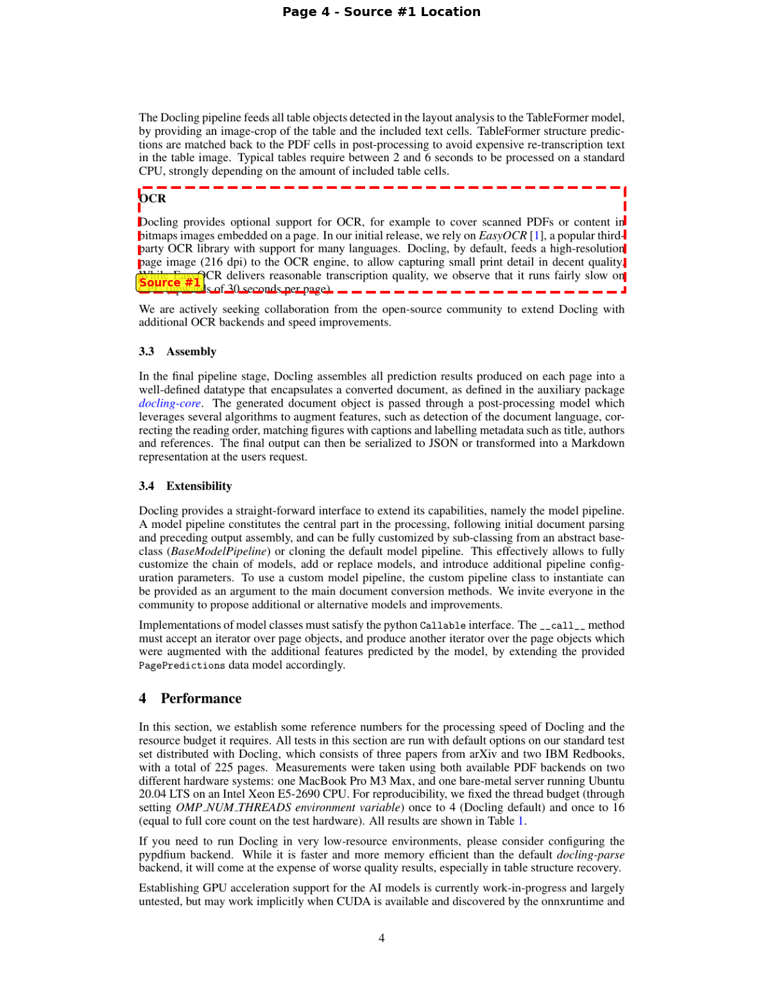



────────────────────────────────────────────────────────────────────────────────
📄 SOURCE #2
────────────────────────────────────────────────────────────────────────────────
📝 Text: Docling is designed to allow easy extension of the model library and pipelines. In the future, we plan to extend Docling with several more models, such as a figure-classifier model, an equationrecogni...
📁 File: 2408.09869v5.pdf
📑 Section: 6 Future work and contributions
📄 Page: 5
📐 Bounding Box: [108, 322, 504, 259]

🖼️  Visualizing bounding box on page 5:


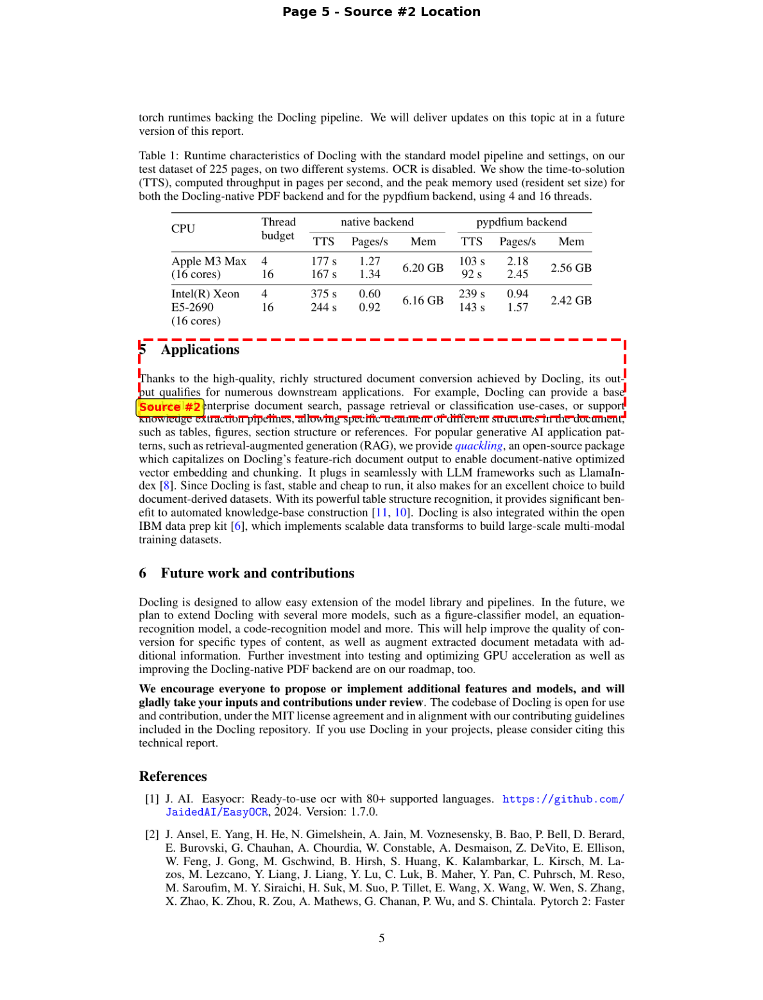



────────────────────────────────────────────────────────────────────────────────
📄 SOURCE #3
────────────────────────────────────────────────────────────────────────────────
📝 Text: In the final pipeline stage, Docling assembles all prediction results produced on each page into a well-defined datatype that encapsulates a converted document, as defined in the auxiliary package doc...
📁 File: 2408.09869v5.pdf
📑 Section: 3.3 Assembly
📄 Page: 4
📐 Bounding Box: [108, 505, 504, 431]

🖼️  Visualizing bounding box on page 4:


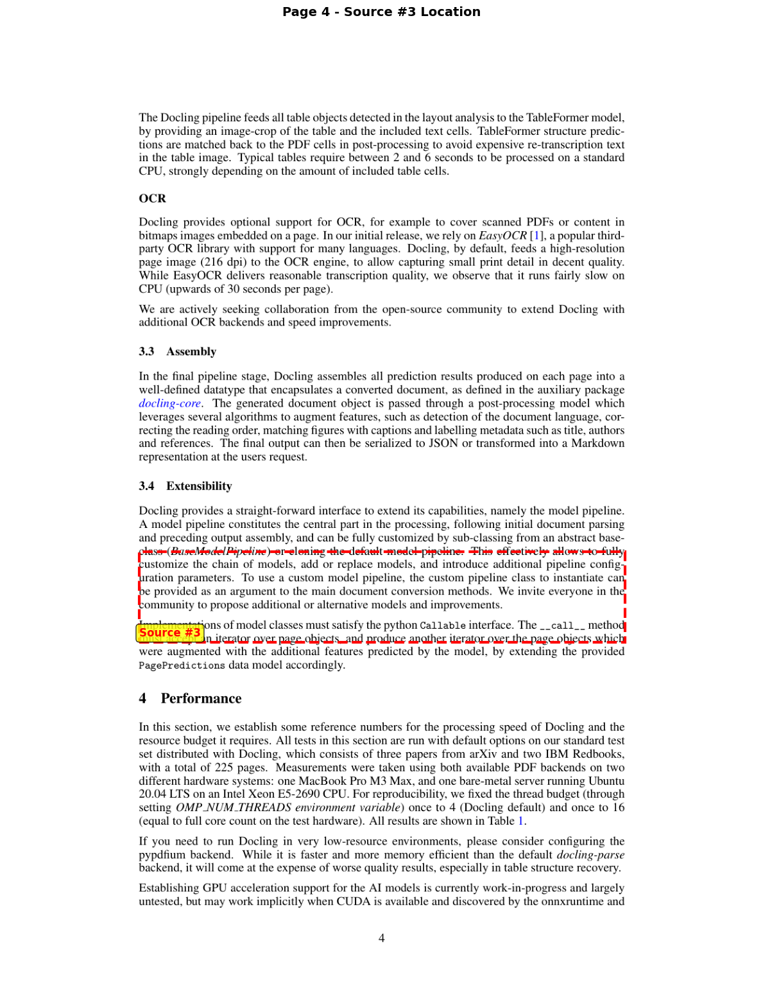



────────────────────────────────────────────────────────────────────────────────
📄 SOURCE #4
────────────────────────────────────────────────────────────────────────────────
📝 Text: Docling implements a linear pipeline of operations, which execute sequentially on each given document (see Fig. 1). Each document is first parsed by a PDF backend, which retrieves the programmatic tex...
📁 File: 2408.09869v5.pdf
📑 Section: 3 Processing pipeline
📄 Page: 2
📐 Bounding Box: [108, 272, 504, 176]

🖼️  Visualizing bounding box on page 2:


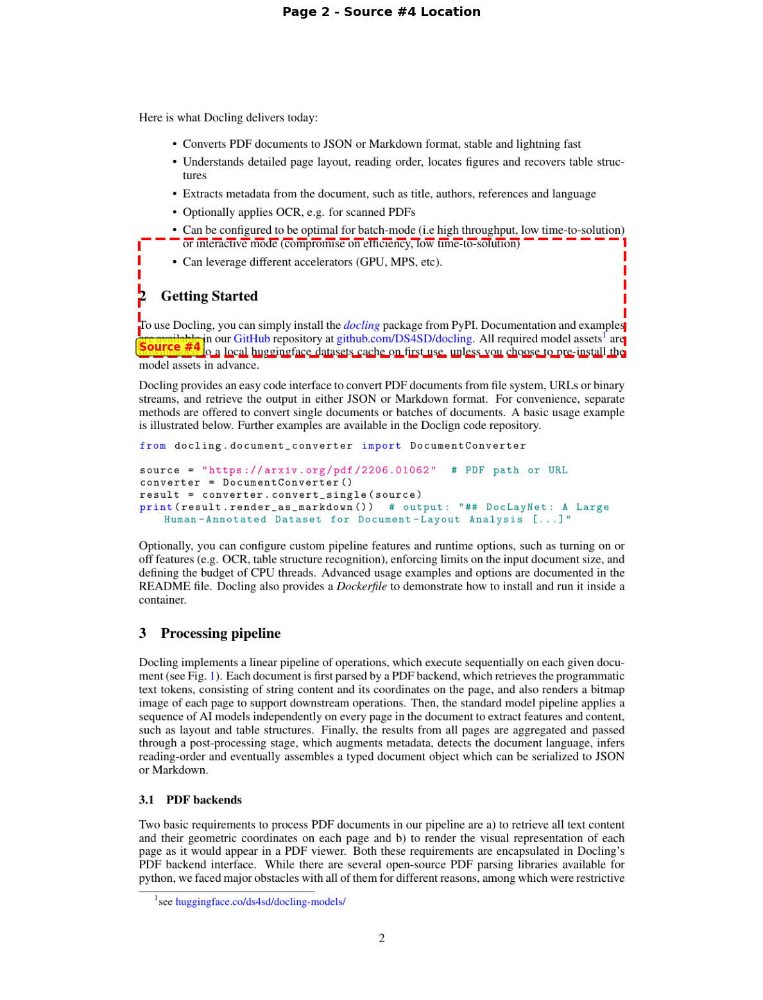



────────────────────────────────────────────────────────────────────────────────
📄 SOURCE #5
────────────────────────────────────────────────────────────────────────────────
📝 Text: As part of Docling, we initially release two highly capable AI models to the open-source community, which have been developed and published recently by our team. The first model is a layout analysis m...
📁 File: 2408.09869v5.pdf
📑 Section: 3.2 AI models
📄 Page: 3
📐 Bounding Box: [108, 404, 504, 330]

🖼️  Visualizing bounding box on page 3:


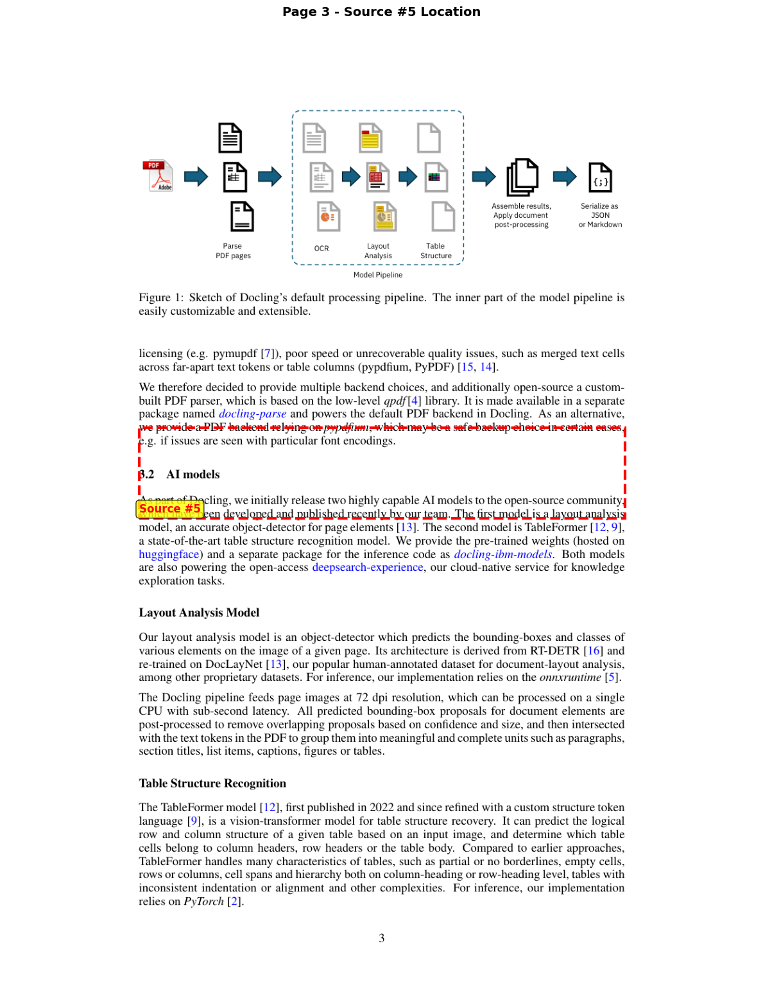



────────────────────────────────────────────────────────────────────────────────
📄 SOURCE #6
────────────────────────────────────────────────────────────────────────────────
📝 Text: Docling provides a straight-forward interface to extend its capabilities, namely the model pipeline. A model pipeline constitutes the central part in the processing, following initial document parsing...
📁 File: 2408.09869v5.pdf
📑 Section: 3.4 Extensibility
📄 Page: 4
📐 Bounding Box: [108, 396, 504, 311]

🖼️  Visualizing bounding box on page 4:


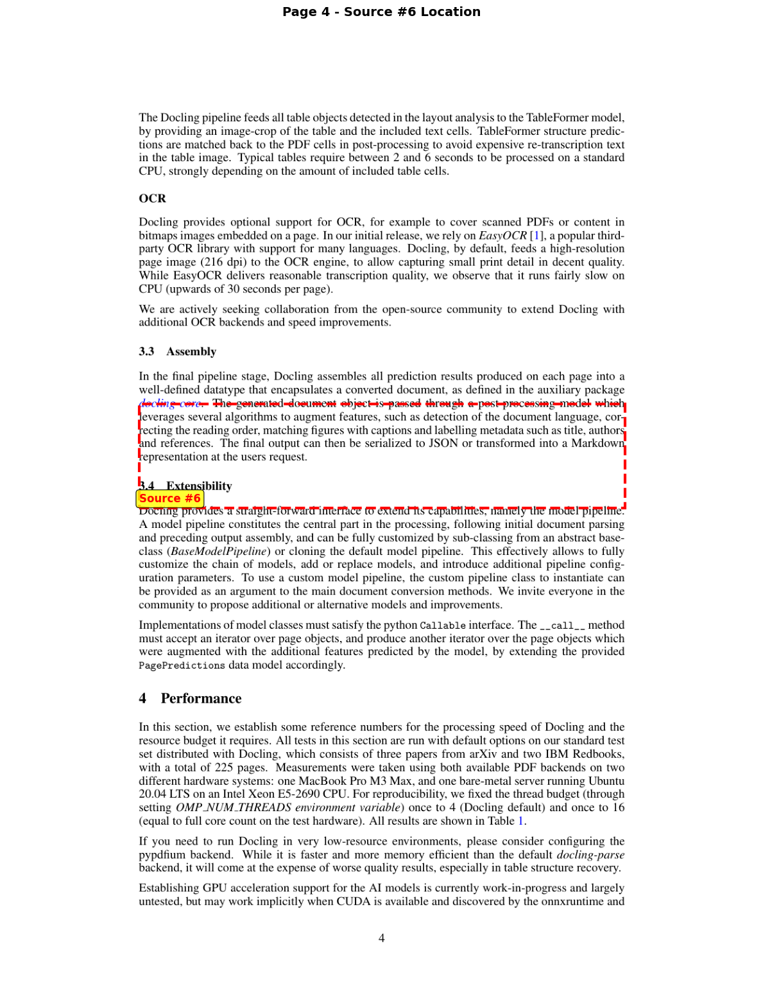

In [25]:
from docling.chunking import DocChunk
import fitz  # PyMuPDF
from PIL import Image
import io
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from IPython.display import display, Markdown, HTML

# Display results
print("="*80)
print(f"❓ QUESTION:\n{QUESTION}\n")
print("="*80)
print(f"💬 ANSWER:")
display(Markdown(qdrant_rag_result['answer_builder']['answers'][0].data.strip()))
print("="*80)
print("📚 SOURCES (with Document-Level Grounding):\n")

sources = qdrant_rag_result["answer_builder"]["answers"][0].documents

# Open the PDF document once for all sources
pdf_document = None
if EXPORT_TYPE == ExportType.DOC_CHUNKS and sources:
    # Get the PDF URL from the first source
    first_chunk = DocChunk.model_validate(sources[0].meta["dl_meta"])
    if first_chunk.meta.origin:
        pdf_url = PATHS[0]
        # Download and open PDF
        import requests
        response = requests.get(pdf_url)
        pdf_document = fitz.open(stream=response.content, filetype="pdf")

for idx, source in enumerate(sources, 1):
    print(f"\n{'─'*80}")
    print(f"📄 SOURCE #{idx}")
    print(f"{'─'*80}")
    
    if EXPORT_TYPE == ExportType.DOC_CHUNKS:
        # Extract rich metadata from DocChunk
        doc_chunk = DocChunk.model_validate(source.meta["dl_meta"])
        
        print(f"📝 Text: {doc_chunk.text[:200]}..." if len(doc_chunk.text) > 200 else f"📝 Text: {doc_chunk.text}")
        
        if doc_chunk.meta.origin:
            print(f"📁 File: {doc_chunk.meta.origin.filename}")
        
        if doc_chunk.meta.headings:
            print(f"📑 Section: {' / '.join(doc_chunk.meta.headings)}")
        
        # Bounding box and page information
        if doc_chunk.meta.doc_items and doc_chunk.meta.doc_items[0].prov:
            bbox = doc_chunk.meta.doc_items[0].prov[0].bbox
            page_no = doc_chunk.meta.doc_items[0].prov[0].page_no
            print(f"📄 Page: {page_no}")
            print(f"📐 Bounding Box: [{int(bbox.l)}, {int(bbox.t)}, {int(bbox.r)}, {int(bbox.b)}]")
            
            # Visualize the bounding box on the PDF page
            if pdf_document and page_no <= len(pdf_document):
                print(f"\n🖼️  Visualizing bounding box on page {page_no}:")
                
                # Get the page
                page = pdf_document[page_no - 1]  # 0-indexed
                
                # Render page to image at higher resolution for better quality
                mat = fitz.Matrix(2, 2)  # 2x zoom for better quality
                pix = page.get_pixmap(matrix=mat)
                img = Image.open(io.BytesIO(pix.tobytes("png")))
                
                # Create matplotlib figure
                fig, ax = plt.subplots(figsize=(12, 16))
                ax.imshow(img)
                
                # Draw bounding box (coordinates need to be scaled by zoom factor)
                zoom = 2
                rect = patches.Rectangle(
                    (bbox.l * zoom, bbox.t * zoom),
                    (bbox.r - bbox.l) * zoom,
                    (bbox.b - bbox.t) * zoom,
                    linewidth=3,
                    edgecolor='red',
                    facecolor='none',
                    linestyle='--'
                )
                ax.add_patch(rect)
                
                # Add label
                ax.text(
                    bbox.l * zoom,
                    bbox.t * zoom - 10,
                    f'Source #{idx}',
                    color='red',
                    fontsize=12,
                    fontweight='bold',
                    bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.8)
                )
                
                ax.axis('off')
                ax.set_title(f"Page {page_no} - Source #{idx} Location", fontsize=14, fontweight='bold')
                plt.tight_layout()
                plt.show()
                print()
    
    elif EXPORT_TYPE == ExportType.MARKDOWN:
        print(f"📝 Content: {source.content}")

# Close PDF document
if pdf_document:
    pdf_document.close()

print("\n" + "="*80)

---

## 🎯 Key Concepts Explained

### 1. **DoclingConverter**
Docling's PDF parser that:
- Extracts text with layout understanding
- Identifies document structure (headings, tables, figures)
- Preserves spatial information (bounding boxes, page numbers)
- Supports multiple export formats

### 2. **HybridChunker**
Smart chunking algorithm that:
- Respects document structure (doesn't break mid-sentence)
- Uses tokenizer to ensure chunks fit embedding model limits
- Balances semantic coherence with token constraints
- Preserves metadata at chunk level

### 3. **Sentence Transformers**
Neural embedding models that:
- Convert text to dense vectors (384 dimensions for all-MiniLM-L6-v2)
- Capture semantic meaning in vector space
- Enable similarity search via cosine distance
- Efficient for both indexing and querying

### 4. **Vector Databases (Milvus & Qdrant)**
Specialized databases for:
- Storing high-dimensional vectors efficiently
- Fast approximate nearest neighbor (ANN) search
- Metadata filtering alongside vector search
- Horizontal scaling for production workloads

### 5. **Prompt Engineering**
The prompt template combines:
- Retrieved context (top-K documents)
- User query
- Structured format for LLM comprehension
- Jinja2 templating for dynamic content

### 6. **Answer Builder**
Aggregates:
- LLM-generated response
- Source documents with metadata
- Confidence scores
- Full provenance chain for transparency

---

## 🔄 Side-by-Side Comparison

```mermaid
%%{init: {'theme':'base', 'themeVariables': { 'primaryColor':'#4dabf7','secondaryColor':'#f06595','tertiaryColor':'#51cf66'}}}%%
flowchart LR
    subgraph Milvus["🔵 MILVUS STACK"]
        M1["MilvusDocumentStore"]
        M2["MilvusEmbeddingRetriever"]
        M3["C++ Engine"]
        M4["Enterprise Scale"]
    end
    
    subgraph Qdrant["🔴 QDRANT STACK"]
        Q1["QdrantDocumentStore"]
        Q2["QdrantEmbeddingRetriever"]
        Q3["Rust Engine"]
        Q4["Lightweight"]
    end
    
    subgraph Common["🟢 SHARED COMPONENTS"]
        C1["DoclingConverter"]
        C2["SentenceTransformers"]
        C3["PromptBuilder"]
        C4["HuggingFace LLM"]
        C5["AnswerBuilder"]
    end
    
    Common --> Milvus
    Common --> Qdrant
    
    style Milvus fill:#4dabf7,stroke:#1971c2,stroke-width:3px,color:#fff
    style Qdrant fill:#f06595,stroke:#c2255c,stroke-width:3px,color:#fff
    style Common fill:#51cf66,stroke:#2f9e44,stroke-width:3px,color:#fff
```

---

## 💡 Advanced Usage Examples

### Example 1: Custom Question

In [15]:
# Try a different question
custom_question = "What PDF backends does Docling support?"

print(f"🔍 Custom Question: {custom_question}\n")

# Query with Milvus
custom_result = milvus_rag_pipe.run(
    {
        "embedder": {"text": custom_question},
        "prompt_builder": {"query": custom_question},
        "answer_builder": {"query": custom_question},
    }
)

print("💬 Answer:")
print(custom_result['answer_builder']['answers'][0].data.strip())

2026-01-14 19:40:55,379 - INFO - Warming up component embedder...
2026-01-14 19:40:55,379 - INFO - Warming up component llm...
2026-01-14 19:40:55,379 - INFO - Running component embedder


🔍 Custom Question: What PDF backends does Docling support?



Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2026-01-14 19:40:55,401 - INFO - Running component retriever
2026-01-14 19:40:55,402 - INFO - Running component prompt_builder
2026-01-14 19:40:55,403 - INFO - Running component llm
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2026-01-14 19:40:56,026 - INFO - Running component answer_builder


💬 Answer:
Docling supports both Apple's PDF system and the EPUB system.


### Example 2: Compare Retrieved Chunks Between Vector Databases

In [19]:
test_query = "How does Docling handle tables?"

from haystack.components.embedders import SentenceTransformersTextEmbedder

# Get embedding for Milvus (384-dim)
print("🔵 Querying Milvus with 384-dim embeddings...")
milvus_embedder = SentenceTransformersTextEmbedder(model=EMBED_MODEL_ID)
milvus_embedder.warm_up()
milvus_query_embedding = milvus_embedder.run(test_query)["embedding"]

# Retrieve from Milvus
milvus_retriever = MilvusEmbeddingRetriever(
    document_store=milvus_document_store,
    top_k=3
)
milvus_docs = milvus_retriever.run(query_embedding=milvus_query_embedding)["documents"]

# Get embedding for Qdrant (768-dim) - MUST use the same model as indexing!
print("🔴 Querying Qdrant with 768-dim embeddings...")
qdrant_embedder = SentenceTransformersTextEmbedder(model=QDRANT_EMBED_MODEL)
qdrant_embedder.warm_up()
qdrant_query_embedding = qdrant_embedder.run(test_query)["embedding"]

# Retrieve from Qdrant
qdrant_retriever = QdrantEmbeddingRetriever(
    document_store=qdrant_document_store,
    top_k=3
)
qdrant_docs = qdrant_retriever.run(query_embedding=qdrant_query_embedding)["documents"]

# Compare
print(f"\n{'='*80}")
print(f"❓ Query: {test_query}")
print("="*80)
print("🔵 MILVUS TOP-3 CHUNKS (384-dim):")
print("="*80)
for i, doc in enumerate(milvus_docs, 1):
    print(f"\n{i}. {doc.content[:150]}...")
    print(f"   Score: {doc.score if hasattr(doc, 'score') else 'N/A'}")

print("\n" + "="*80)
print("🔴 QDRANT TOP-3 CHUNKS (768-dim):")
print("="*80)
for i, doc in enumerate(qdrant_docs, 1):
    print(f"\n{i}. {doc.content[:150]}...")
    print(f"   Score: {doc.score if hasattr(doc, 'score') else 'N/A'}")

🔵 Querying Milvus with 384-dim embeddings...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

🔴 Querying Qdrant with 768-dim embeddings...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]


❓ Query: How does Docling handle tables?
🔵 MILVUS TOP-3 CHUNKS (384-dim):

1. Table Structure Recognition
The TableFormer model [12], first published in 2022 and since refined with a custom structure token language [9], is a vis...
   Score: 0.7691353261470795

2. 6 Future work and contributions
Docling is designed to allow easy extension of the model library and pipelines. In the future, we plan to extend Docli...
   Score: 0.7489103972911835

3. 3 Processing pipeline
Docling implements a linear pipeline of operations, which execute sequentially on each given document (see Fig. 1). Each documen...
   Score: 0.7480617165565491

🔴 QDRANT TOP-3 CHUNKS (768-dim):

1. 4 Performance
In this section, we establish some reference numbers for the processing speed of Docling and the resource budget it requires. All tests ...
   Score: 0.5424685229838202

2. 3.3 Assembly
In the final pipeline stage, Docling assembles all prediction results produced on each page into a well-defined datatype that 

---

## 📚 Summary

### What We Built:

1. **Two Complete RAG Pipelines** using Milvus and Qdrant vector databases
2. **Document Processing** with Docling's intelligent PDF parsing
3. **Smart Chunking** using HybridChunker for semantic coherence
4. **Vector Embeddings** with Sentence Transformers
5. **Similarity Search** for relevant context retrieval
6. **LLM Generation** with HuggingFace Mixtral model
7. **Document-Level Grounding** with page numbers, bounding boxes, and section headings

### Key Takeaways:

✅ **Docling** provides superior document understanding vs. simple text extraction  
✅ **HybridChunker** respects document structure for better chunk quality  
✅ **Vector databases** enable fast semantic search at scale  
✅ **Haystack** provides a clean, modular RAG framework  
✅ **Both Milvus and Qdrant** work seamlessly with minor API differences  
✅ **Document grounding** enables citation and transparency in RAG systems  

### Production Considerations:

- **Milvus**: Choose for large-scale deployments (millions+ documents)
- **Qdrant**: Choose for faster setup and moderate scale (thousands-hundreds of thousands)
- **GPU Acceleration**: Use for faster Docling PDF processing
- **HuggingFace Token**: Required for higher API quotas
- **Monitoring**: Track retrieval quality and LLM hallucinations
- **Chunking Strategy**: Experiment with chunk size for your domain

---

🎉 **Congratulations!** You now understand RAG with Haystack, Docling, Milvus, and Qdrant!